# Differential Kinetic Testing

This notebook is for conducting differential kinetic testing for clusters in autoencoder embeddings

### Data Preprocessing

In [1]:
import scvelo as scv
import scanpy as sc
import numpy as np
import sklearn
scv.set_figure_params()

In [2]:
adata = scv.datasets.dentategyrus_lamanno()
adata_raw = adata.copy()
sc.pp.neighbors(adata)
sc.tl.umap(adata)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


         Falling back to preprocessing with `sc.pp.pca` and default params.


In [3]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.filter_and_normalize(adata_raw, log=False, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 18710 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
Filtered out 18710 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
computing neighbors
    finished (0:00:04) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


recovering dynamics (using 2/28 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:20:33) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:22) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 2/28 cores)
    finished (0:01:48) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


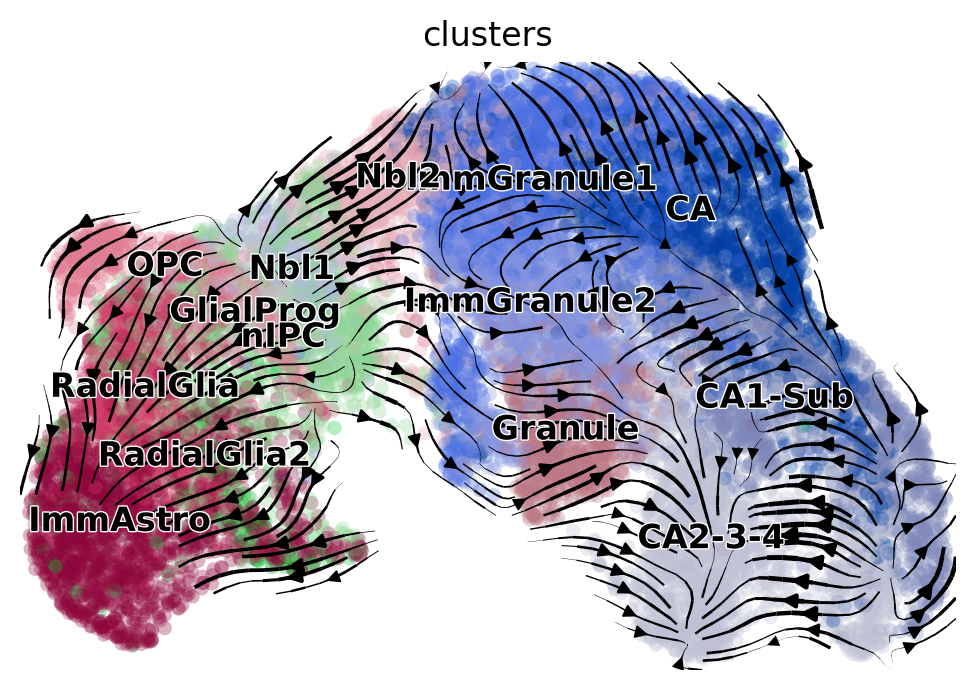

computing terminal states
    identified 4 regions of root cells and 2 regions of end points .
    finished (0:00:02) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:07) --> added 
    'latent_time', shared time (adata.obs)


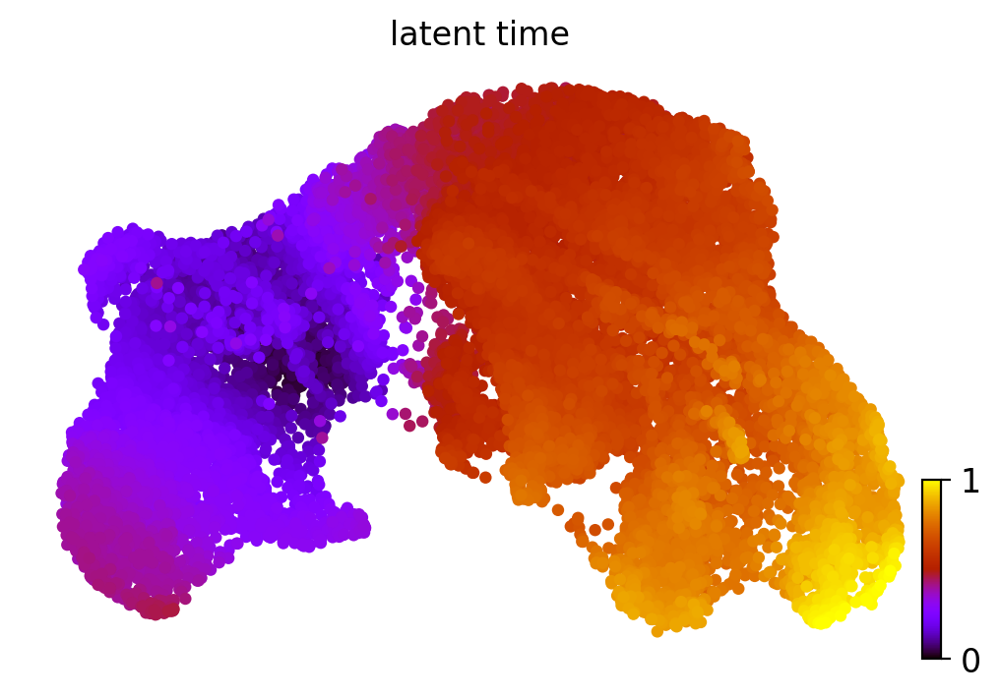

In [4]:
# Extract dynamical velocity vectors
scv.tl.recover_dynamics(adata, n_jobs=2)
scv.tl.velocity(adata, mode='dynamical', use_raw=True)
scv.tl.velocity_graph(adata, n_jobs=2)
scv.pl.velocity_embedding_stream(adata, basis='umap')

# Latent time inference
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

In [5]:
X = np.tile(adata_raw.X.A[:, adata.var["velocity_genes"]], (5, 1))
Y = np.tile(adata.layers["velocity"][:, adata.var["velocity_genes"]], (5, 1))
noise_sigma = (adata_raw.X.A.std()/65)**2
X[adata_raw.shape[0]:, :] += \
    np.random.normal(0, noise_sigma, X[adata_raw.shape[0]:, :].shape)

X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, 
                                                    Y, 
                                                    test_size=0.1, 
                                                    random_state=42)

# we see that noise has been added to denoise the autoencoder
print(X[:100])
print(X[adata_raw.shape[0]:(adata_raw.shape[0]+100), :])

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.6629593 0.        0.6629593]
 [0.        0.        0.        ... 0.        0.        1.5268502]
 ...
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.361451  ... 0.361451  0.        1.084353 ]
 [0.        0.        1.3105614 ... 0.6552807 0.        1.3105614]]
[[-1.6210900e-03  1.0656472e-03  1.7256186e-03 ... -1.7635267e-03
  -2.3783213e-03  1.6181878e-03]
 [-3.8460882e-03  1.6915326e-03 -7.0752855e-04 ...  6.6373575e-01
  -6.8586582e-04  6.6020882e-01]
 [-6.9987123e-05  4.5827212e-04  1.8993255e-03 ...  6.5371103e-04
  -3.0042368e-03  1.5283110e+00]
 ...
 [ 1.3994635e-03 -1.8740216e-03  2.2868153e-03 ... -1.9467417e-03
   5.1346346e-04  3.1302425e-03]
 [ 1.5745206e-03  1.7573046e-03  3.6168423e-01 ...  3.6112034e-01
   1.5465170e-03  1.0831199e+00]
 [ 2.5013532e-04  1.2935700e-03  1.3103670e+00 ...  6.5555733e-01
  -8.5927680e-04  1.310646

### Model Training

In [6]:
from tensorflow import keras
from tensorflow.keras import layers
import sklearn
import numpy as np
import tensorflow as tf

tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [7]:
input_dim = keras.Input(shape=(X.shape[1],))
encoded = layers.Dense(64, kernel_regularizer=keras.regularizers.l1(1e-6))(input_dim)
encoded = layers.Dense(16, kernel_regularizer=keras.regularizers.l1(1e-2))(encoded)

decoded = layers.Dense(16, kernel_regularizer=keras.regularizers.l1(1e-4))(encoded)
decoded = layers.Dense(64, kernel_regularizer=keras.regularizers.l1(1e-6))(decoded)
decoded = layers.Dense(Y.shape[1])(decoded)

# This model maps an input to its reconstruction
encoder = keras.Model(input_dim, encoded)
autoencoder = keras.Model(input_dim, decoded)

opt = keras.optimizers.Adam(learning_rate=0.00005)
autoencoder.compile(optimizer=opt, loss='mse')
autoencoder.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1067)]            0         
_________________________________________________________________
dense (Dense)                (None, 64)                68352     
_________________________________________________________________
dense_1 (Dense)              (None, 16)                1040      
_________________________________________________________________
dense_2 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_3 (Dense)              (None, 64)                1088      
_________________________________________________________________
dense_4 (Dense)              (None, 1067)              69355     
Total params: 140,107
Trainable params: 140,107
Non-trainable params: 0
_____________________________________________________

2021-11-11 17:01:36.243168: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2021-11-11 17:01:36.771068: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1510] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15405 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:81:00.0, compute capability: 6.0


In [8]:
es = keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
autoencoder.fit(X_train, y_train,
        epochs=100,
        batch_size=2,
        shuffle=True,
        validation_data=(X_test, y_test),
        callbacks=[es])

2021-11-11 17:01:37.760491: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/100
40979/40979 [==============================] - 61s 1ms/step - loss: 0.1649 - val_loss: 0.0534
Epoch 2/100
40979/40979 [==============================] - 58s 1ms/step - loss: 0.0509 - val_loss: 0.0497
Epoch 3/100
40979/40979 [==============================] - 59s 1ms/step - loss: 0.0486 - val_loss: 0.0483
Epoch 4/100
40979/40979 [==============================] - 60s 1ms/step - loss: 0.0476 - val_loss: 0.0480
Epoch 5/100
40979/40979 [==============================] - 58s 1ms/step - loss: 0.0471 - val_loss: 0.0473
Epoch 6/100
40979/40979 [==============================] - 58s 1ms/step - loss: 0.0467 - val_loss: 0.0468
Epoch 7/100
40979/40979 [==============================] - 60s 1ms/step - loss: 0.0464 - val_loss: 0.0467
Epoch 8/100
40979/40979 [==============================] - 59s 1ms/step - loss: 0.0462 - val_loss: 0.0467
Epoch 9/100
40979/40979 [==============================] - 58s 1ms/step - loss: 0.0461 - val_loss: 0.0464
Epoch 10/100
40979/40979 [====================

### UMAP Projections

In [9]:
from scipy.integrate import odeint, solve_ivp
import umap
import matplotlib.pyplot as plt

In [10]:
pca = sklearn.decomposition.PCA(n_components=30)
adata_pca = pca.fit_transform(np.log1p(adata_raw.X.A[:, adata.var["velocity_genes"]]))
umap_reducer = umap.UMAP(random_state=42, n_neighbors=30, min_dist=0.25)
adata_umap = umap_reducer.fit_transform(adata_pca)
neigh = sklearn.neighbors.NearestNeighbors(n_neighbors=30)
neigh.fit(adata_pca)

NearestNeighbors(n_neighbors=30)

In [25]:
# ODE Solver Function
def raw_ae(t, in_x):
    input_x = tf.convert_to_tensor(np.expand_dims(in_x, axis=0))
    dx = autoencoder.predict(input_x).flatten() * 0.6
    return dx

# Interpolate over time
def interpolate(y0, neigh=neigh, pca=pca, umap_reducer=umap_reducer, steps=40, intermediate_steps=5):
    
    solution = []
    for step in range(steps):
        
        # Interpolate using autoencoder
        t_eval = list(range(intermediate_steps))
        #noise = np.random.normal(0, np.sqrt(adata.var["fit_variance"][adata.var["velocity_genes"]]), 
        #                          y0.shape[0])
        sol = solve_ivp(raw_ae, [0,max(t_eval)], y0, method="DOP853", t_eval=t_eval)
        y = sol.y.T
        
        # Lower dimensionality
        ending_pt_pca = pca.transform(np.nan_to_num(np.log1p(y)))
        ending_pt = umap_reducer.transform(ending_pt_pca)
        
        # Find knn reference points
        interp_neigh = neigh.kneighbors(ending_pt_pca)
        
        # New reference point
        y0 = np.median(X[interp_neigh[1][-1, :], :], axis=0)
        solution.append(y0)
        
        # Plot UMAP directions
        plt.figure(figsize=(10,3))
        plt.subplot(1, 3, 1)
        plt.scatter(adata_umap[:, 0], adata_umap[:, 1], 
                    s=1, 
                    alpha=0.5,
                    cmap="tab20",
                    c=adata.obs.clusters.cat.codes.to_numpy())
        plt.scatter(ending_pt[:, 0], 
                    ending_pt[:, 1], 
                    c=np.arange(ending_pt.shape[0]), 
                    cmap="viridis",
                    s=20
                   )
        plt.colorbar()
        plt.scatter(ending_pt[0, 0], ending_pt[0, 1], s=20, color="red")
        plt.gca().set_aspect('equal', 'datalim')
        
        # Plot PCA directions
        plt.subplot(1, 3, 2)
        plt.scatter(adata_pca[:, 0], 
                    adata_pca[:, 1], 
                    s=1, 
                    alpha=0.5, 
                    cmap="tab20",
                    c=adata.obs.clusters.cat.codes.to_numpy())
        plt.scatter(ending_pt_pca[:, 0], 
                    ending_pt_pca[:, 1], 
                    c=np.arange(ending_pt.shape[0]), 
                    cmap="viridis",
                    s=20
                   )
        plt.colorbar()
        plt.scatter(ending_pt_pca[0, 0], ending_pt_pca[0, 1], 
                    s=20, color="red")
        plt.gca().set_aspect('equal', 'datalim')

        plt.subplot(1, 3, 3)
        plt.scatter(adata_pca[:, 1], 
                    adata_pca[:, 2], 
                    s=1, 
                    alpha=0.5, 
                    cmap="tab20",
                    c=adata.obs.clusters.cat.codes.to_numpy())
        plt.scatter(ending_pt_pca[:, 1], 
                    ending_pt_pca[:, 2], 
                    c=np.arange(ending_pt.shape[0]), 
                    cmap="viridis",
                    s=20
                   )
        plt.colorbar()
        plt.scatter(ending_pt_pca[0, 1], ending_pt_pca[0, 2], 
                    s=20, color="red")
        plt.gca().set_aspect('equal', 'datalim')
        plt.show()
    
    return np.array(solution)

In [26]:
np.unique(adata.obs.clusters)

array(['CA', 'CA1-Sub', 'CA2-3-4', 'GlialProg', 'Granule', 'ImmAstro',
       'ImmGranule1', 'ImmGranule2', 'Nbl1', 'Nbl2', 'OPC', 'RadialGlia',
       'RadialGlia2', 'nIPC'], dtype=object)

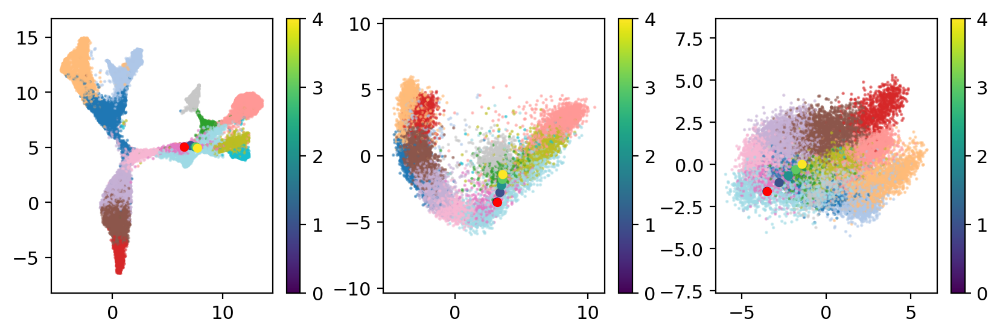

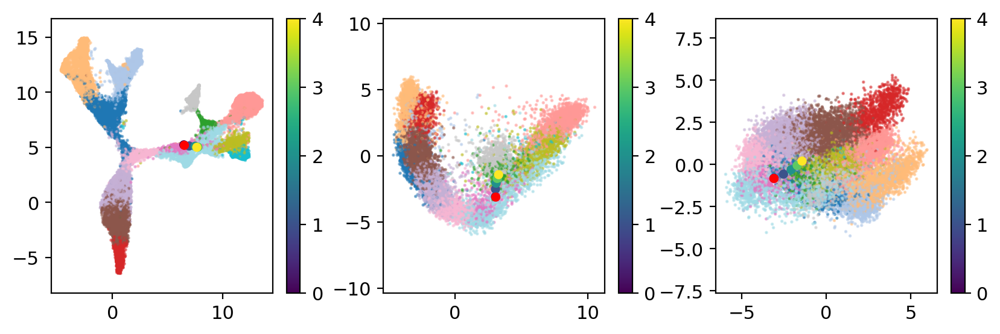

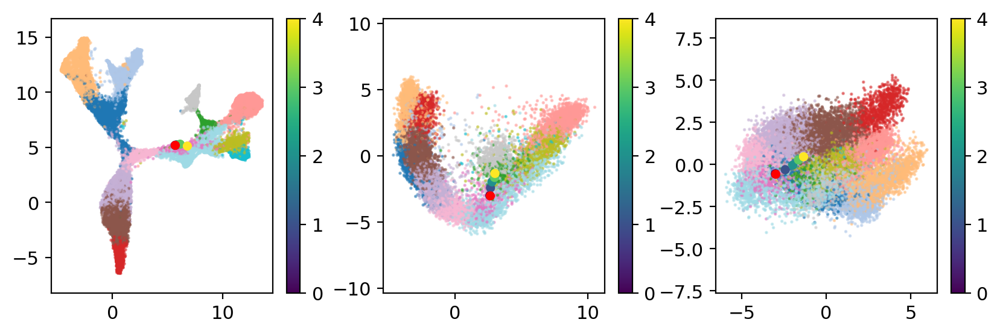

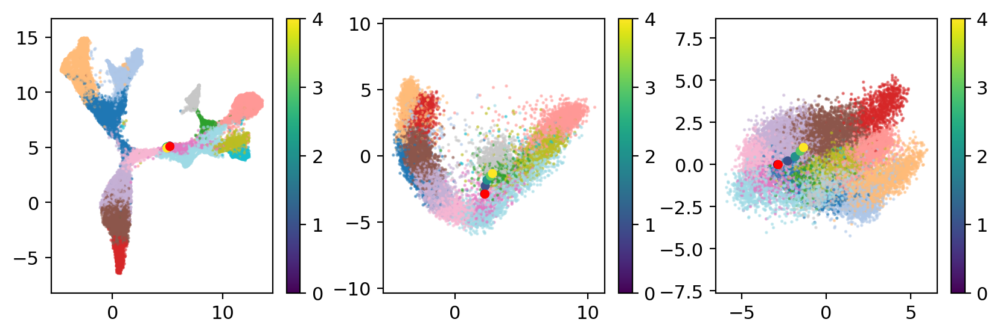

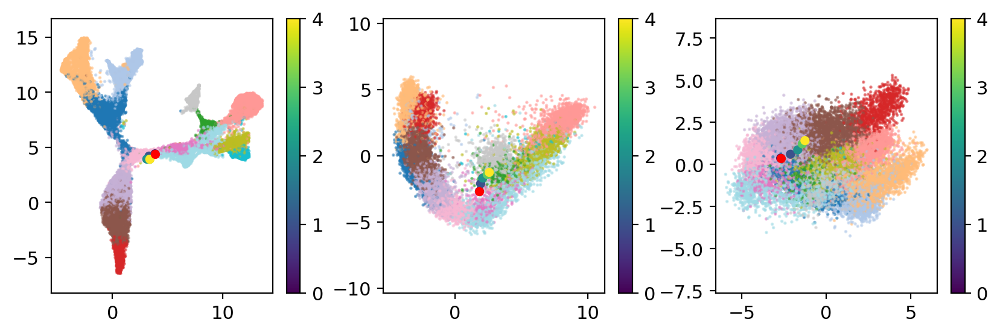

...

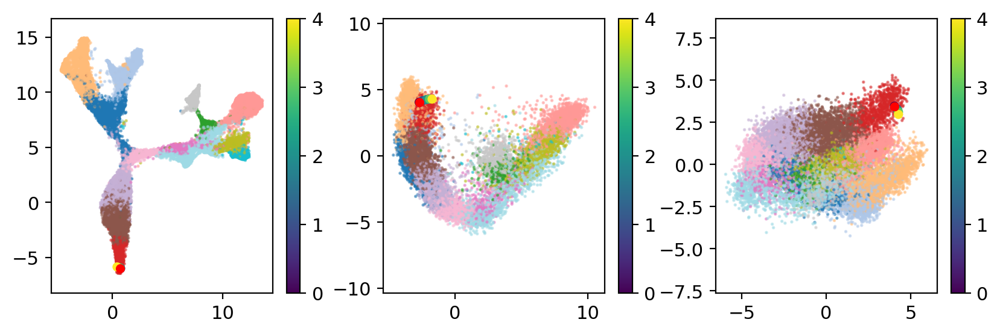

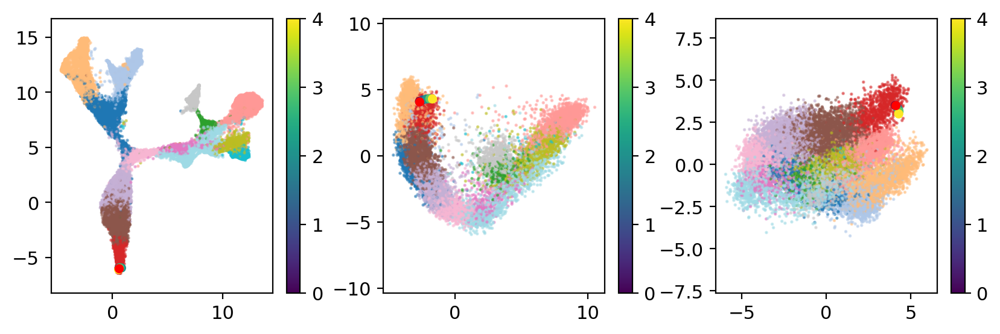

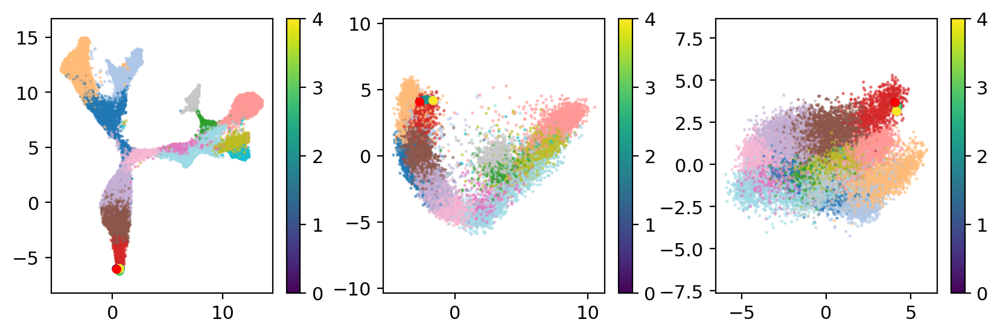

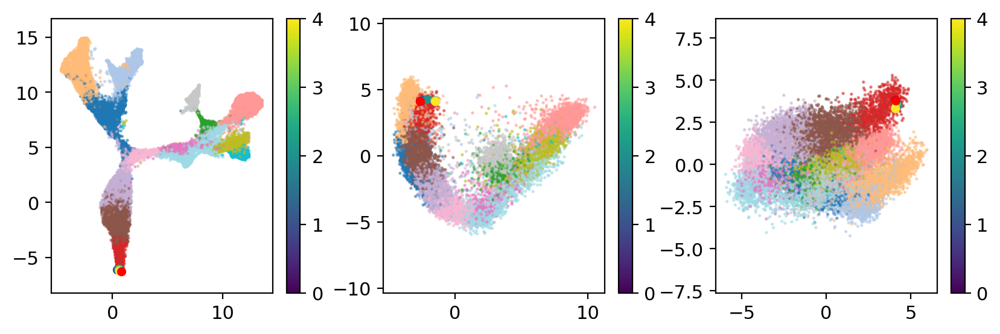

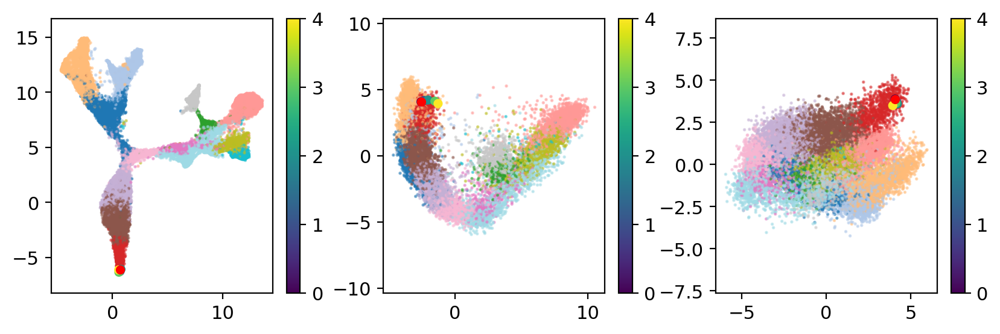

In [27]:
y0 = X[np.where(adata.obs.clusters == "Nbl1")[0][0] + adata.shape[0], :] 
y_solution = interpolate(y0, 
                         neigh = neigh, 
                         pca = pca, 
                         umap_reducer = umap_reducer, steps=35)

### Manifold Visualizations

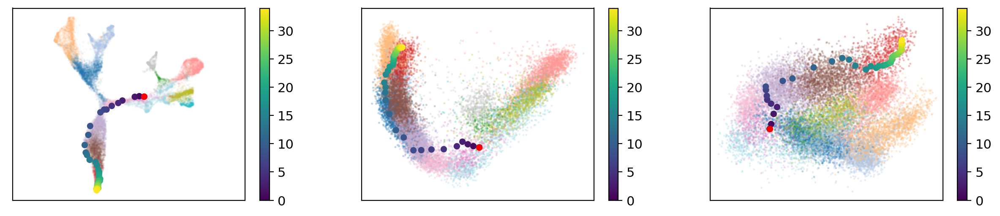

In [90]:
# Lower dimensionality
ending_pt_pca = pca.transform(np.nan_to_num(np.log1p(y_solution)))
ending_pt = umap_reducer.transform(ending_pt_pca)
        
# Plot UMAP directions
plt.figure(figsize=(15,3))
plt.subplot(1, 3, 1)
plt.scatter(adata_umap[:, 0], adata_umap[:, 1], 
            s=1, alpha=0.05,
            cmap="tab20",
            c=adata.obs.clusters.cat.codes.to_numpy())
plt.scatter(ending_pt[:, 0], 
            ending_pt[:, 1], 
            c=np.arange(ending_pt.shape[0]), 
            cmap="viridis",
            s=20
           )
plt.colorbar()
plt.scatter(ending_pt[0, 0], ending_pt[0, 1], s=20, color="red")
plt.gca().set_aspect('equal', 'datalim')
plt.xticks([]),plt.yticks([])

# Plot PCA directions
plt.subplot(1, 3, 2)
plt.scatter(adata_pca[:, 0], 
            adata_pca[:, 1], 
            s=1, 
            alpha=0.2, 
            cmap="tab20",
            c=adata.obs.clusters.cat.codes.to_numpy())
plt.scatter(ending_pt_pca[:, 0], 
            ending_pt_pca[:, 1], 
            c=np.arange(ending_pt.shape[0]), 
            cmap="viridis",
            s=20
           )
plt.colorbar()
plt.scatter(ending_pt_pca[0, 0], ending_pt_pca[0, 1], 
            s=20, color="red")
plt.gca().set_aspect('equal', 'datalim')
plt.xticks([]),plt.yticks([])

plt.subplot(1, 3, 3)
plt.scatter(adata_pca[:, 1], 
            adata_pca[:, 2], 
            s=1, 
            alpha=0.2, 
            cmap="tab20",
            c=adata.obs.clusters.cat.codes.to_numpy())
plt.scatter(ending_pt_pca[:, 1], 
            ending_pt_pca[:, 2], 
            c=np.arange(ending_pt.shape[0]), 
            cmap="viridis",
            s=20
           )
plt.colorbar()
plt.scatter(ending_pt_pca[0, 1], ending_pt_pca[0, 2], 
            s=20, color="red")
plt.gca().set_aspect('equal', 'datalim')
plt.xticks([]),plt.yticks([])
plt.savefig("one-sample-trajectory_dentategyrus.pdf")
plt.show()

saving figure to file ./figures/scvelo_new-velocity_dentategyrus.pdf


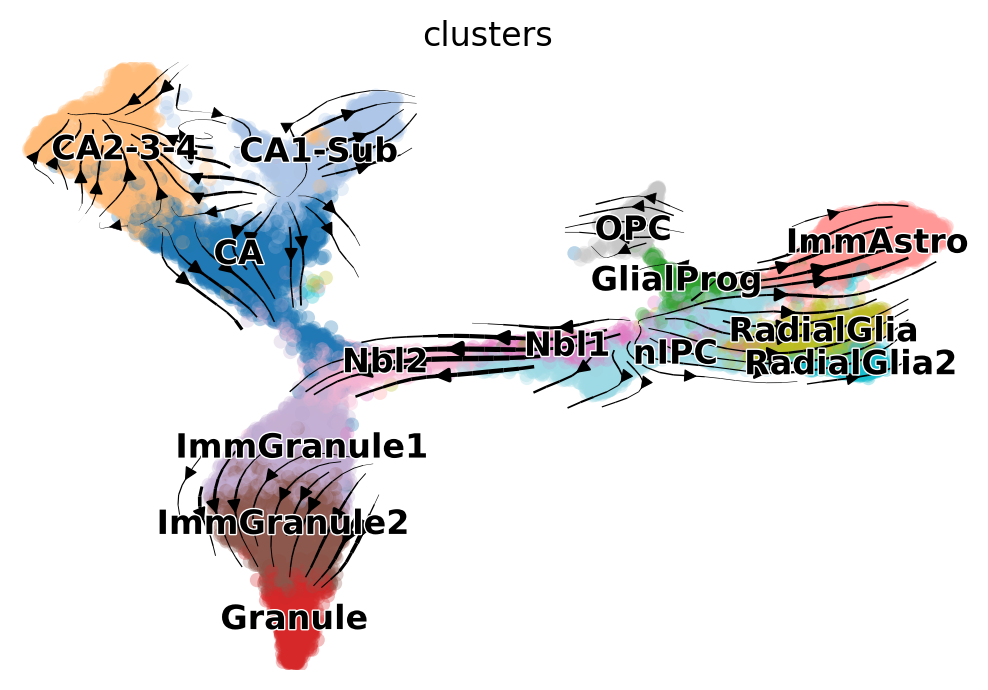

In [97]:
adata.obsm["new_umap"] = adata_umap
scv.pl.velocity_embedding_stream(adata, basis='new_umap', save="new-velocity_dentategyrus", color="clusters", palette="tab20")

### Embedding Visualizations

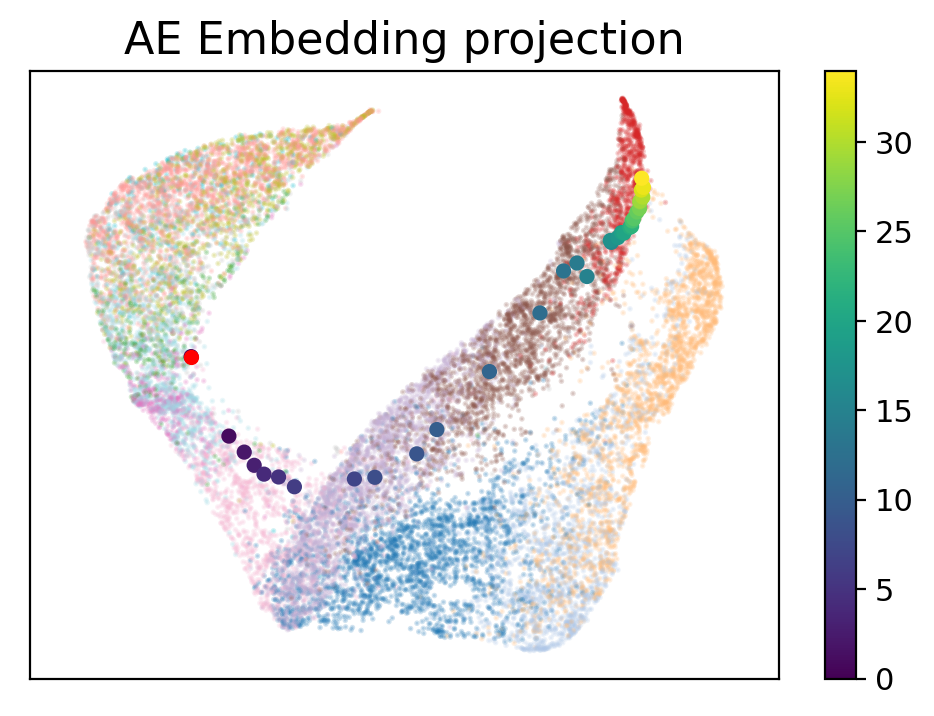

In [101]:
vae_embedding = encoder.predict(adata_raw.X.A[:, adata.var["velocity_genes"]])
vae_embedding_progress = encoder.predict(y_solution)

vae_reducer = umap.UMAP(random_state=42, n_neighbors=50, min_dist=0.25)
vae_embedding_umap = vae_reducer.fit_transform(vae_embedding)
vae_embedding_progress_umap = vae_reducer.transform(vae_embedding_progress)

plt.figure()
plt.scatter(vae_embedding_umap[:, 0], 
            vae_embedding_umap[:, 1], 
            c=adata.obs.clusters.cat.codes.to_numpy(),
            cmap="tab20",
            s=1, 
            alpha=0.2)
plt.scatter(vae_embedding_progress_umap[:, 0], 
            vae_embedding_progress_umap[:, 1], 
            c=np.arange(vae_embedding_progress_umap.shape[0]), 
            cmap="viridis",
            s=20
           )
plt.colorbar()
plt.scatter(vae_embedding_progress_umap[0, 0], vae_embedding_progress_umap[0, 1], s=20, color="red")
plt.gca().set_aspect('equal', 'datalim')
plt.title('AE Embedding projection', fontsize=16)
plt.xticks([]),plt.yticks([])
plt.savefig("ae-embedding-trajectory_dentategyrus.pdf")
plt.show()

### Embedding Clustering and Differential Testing

In [17]:
adata

AnnData object with n_obs × n_vars = 18213 × 2000
    obs: 'Age', 'clusters', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'neighbors', 'umap', 'recover_dynamics', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'clusters_colors'
    obsm: 'X_tsne', 'X_pca', 'X_umap', 'velocity_umap', 'new_umap', 'X_new_umap', 'velocity_new_umap'
    varm: 'loss'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'fit_t', 'fit_tau', 'fit_tau_', 'velocity', 

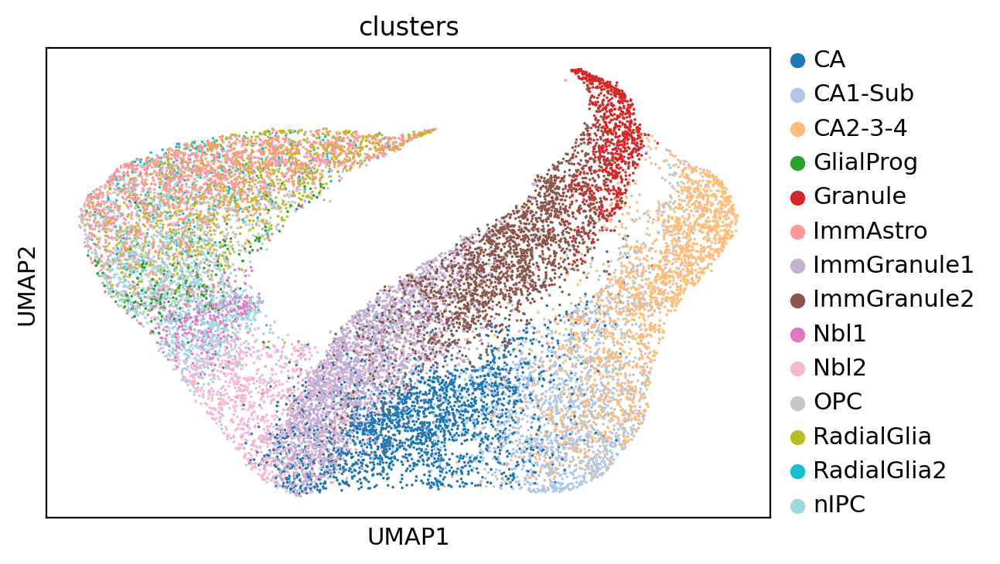

In [102]:
adata.obsm["X_vae_embedding"] = vae_embedding
sc.pp.neighbors(adata, n_neighbors=50, use_rep="X_vae_embedding")
sc.tl.umap(adata)
sc.pl.umap(adata, color=['clusters'], palette="tab20")

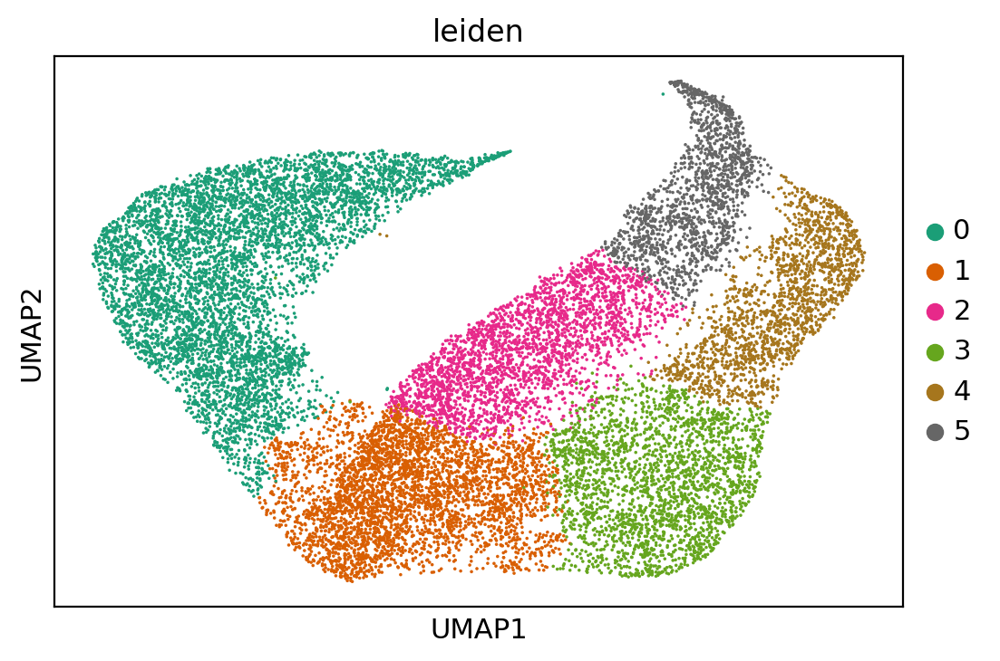

In [106]:
sc.tl.leiden(adata, resolution=0.14)
sc.pl.umap(adata, color=['leiden'], palette="Dark2")

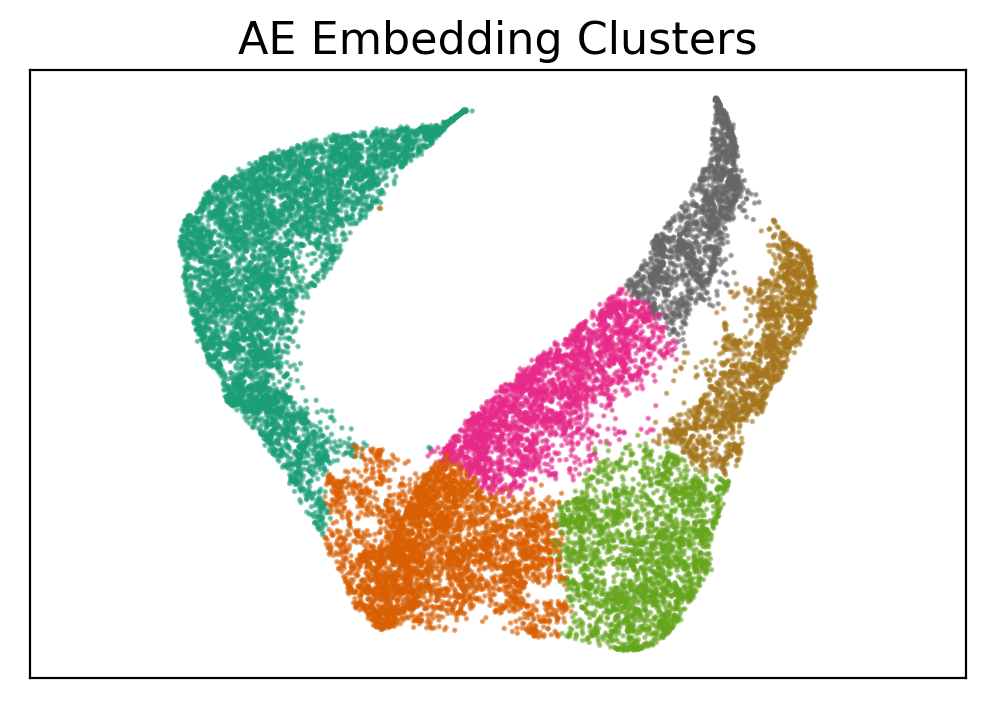

In [105]:
plt.figure()
plt.scatter(vae_embedding_umap[:, 0], 
            vae_embedding_umap[:, 1], 
            c=adata.obs["leiden"].cat.codes.to_numpy(),
            cmap="Dark2",
            s=1, 
            alpha=0.5)
# plt.scatter(vae_embedding_progress_umap[:, 0], 
#             vae_embedding_progress_umap[:, 1], 
#             c=np.arange(vae_embedding_progress_umap.shape[0]), 
#             cmap="viridis",
#             s=20
#            )
# plt.colorbar()
# plt.scatter(vae_embedding_progress_umap[0, 0], vae_embedding_progress_umap[0, 1], s=20, color="red")
plt.gca().set_aspect('equal', 'datalim')
plt.title('AE Embedding Clusters', fontsize=16)
plt.xticks([]),plt.yticks([])
plt.savefig("ae-cluster-color_dentategyrus.pdf")
plt.show()

In [33]:
scv.tl.velocity(adata, mode='dynamical', use_raw=False)
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='leiden')

computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
testing for differential kinetics
    finished (0:00:12) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


saving figure to file ./figures/scvelo_diff_kinetic_testing.pdf


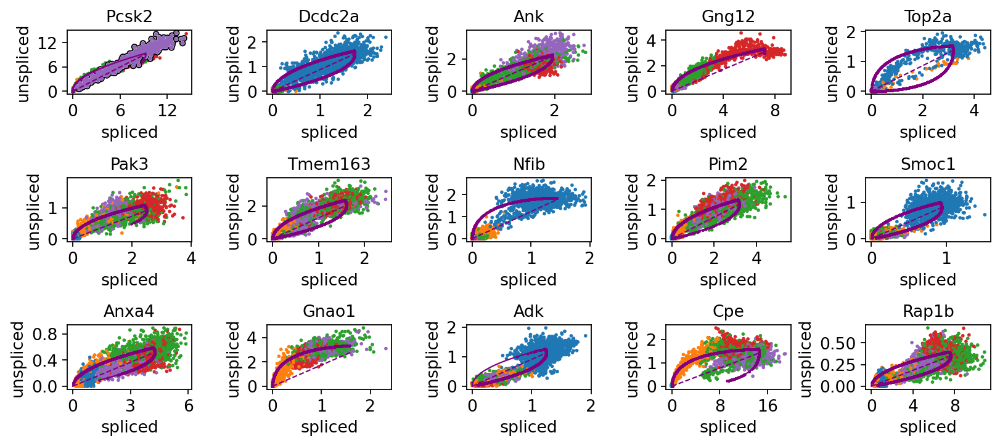

In [112]:
scv.settings.presenter_view = True
scv.pl.scatter(adata, basis=top_genes[:15], 
               ncols=5, add_outline='fit_diff_kinetics', 
               wspace=0.6, hspace=1.3, 
               save="diff_kinetic_testing_dentategyrus")

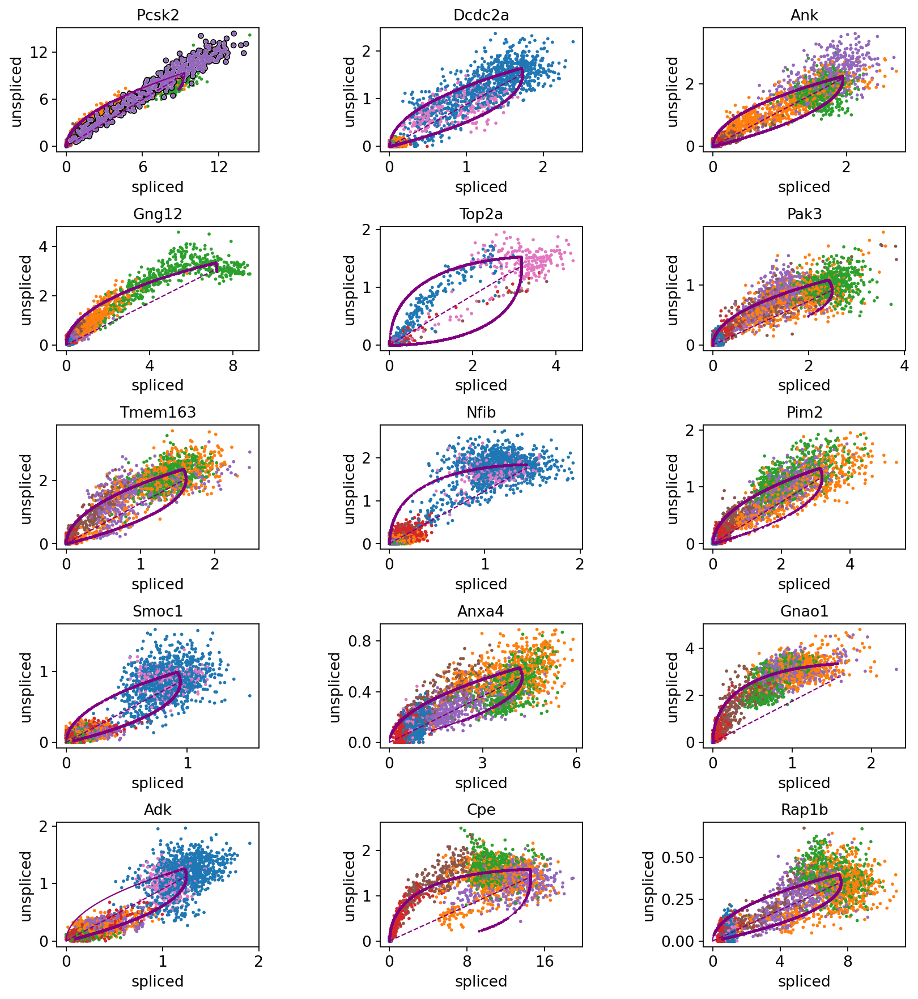

In [42]:
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo') 
scv.pl.scatter(adata, basis=top_genes[:15], ncols=3, add_outline='fit_diff_kinetics', wspace=0.6, hspace=0.6)